<a href="https://colab.research.google.com/github/WarsameJ/Landscape-GANs/blob/main/landscape_gans.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Import Dependencies

In [10]:
! pip install Cython
! pip install torch
!pip install dset

In [11]:
import io
import cv2
import os 
import os.path
import glob
import PIL
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import zipfile
import torch
import torch.nn as nn
import torchvision
import dset
import shutil
import torch.nn.functional as F
import torchvision.transforms as T
from torchvision.datasets import ImageFolder
from torch.utils.data import DataLoader
from torchvision.utils import make_grid
from typing import Any, Callable, cast, Dict, List, Optional, Tuple
from typing import Union
from torchvision.utils import save_image
from tqdm.notebook import tqdm
from IPython.display import Image

os.environ['KAGGLE_CONFIG_DIR'] = '/content'

In [12]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [13]:
!mkdir /content/FOLDER_DIR
!mkdir /content/FOLDER_DIR/DATA_DIR

mkdir: cannot create directory ‘/content/FOLDER_DIR’: File exists
mkdir: cannot create directory ‘/content/FOLDER_DIR/DATA_DIR’: File exists


Get Data

In [14]:
!kaggle datasets download -d arnaud58/landscape-pictures -p /content/FOLDER_DIR/DATA_DIR

 96% 598M/620M [00:04<00:00, 171MB/s]
100% 620M/620M [00:04<00:00, 154MB/s]


In [15]:
!unzip -u "/content/FOLDER_DIR/DATA_DIR/landscape-pictures.zip" -d "/content/FOLDER_DIR/DATA_DIR"

Archive:  /content/FOLDER_DIR/DATA_DIR/landscape-pictures.zip
  inflating: /content/FOLDER_DIR/DATA_DIR/00000000.jpg  
  inflating: /content/FOLDER_DIR/DATA_DIR/00000000_(2).jpg  
  inflating: /content/FOLDER_DIR/DATA_DIR/00000000_(3).jpg  
  inflating: /content/FOLDER_DIR/DATA_DIR/00000000_(4).jpg  
  inflating: /content/FOLDER_DIR/DATA_DIR/00000000_(5).jpg  
  inflating: /content/FOLDER_DIR/DATA_DIR/00000000_(6).jpg  
  inflating: /content/FOLDER_DIR/DATA_DIR/00000000_(7).jpg  
  inflating: /content/FOLDER_DIR/DATA_DIR/00000001.jpg  
  inflating: /content/FOLDER_DIR/DATA_DIR/00000001_(2).jpg  
  inflating: /content/FOLDER_DIR/DATA_DIR/00000001_(3).jpg  
  inflating: /content/FOLDER_DIR/DATA_DIR/00000001_(4).jpg  
  inflating: /content/FOLDER_DIR/DATA_DIR/00000001_(5).jpg  
  inflating: /content/FOLDER_DIR/DATA_DIR/00000001_(6).jpg  
  inflating: /content/FOLDER_DIR/DATA_DIR/00000001_(7).jpg  
  inflating: /content/FOLDER_DIR/DATA_DIR/00000002.jpg  
  inflating: /content/FOLDER_DIR/DA

In [16]:
FOLDER_DIR = "/content/FOLDER_DIR"
DATA_DIR = "/content/FOLDER_DIR/DATA_DIR"

Preprocess Images


In [17]:
image_size = 64
stats = (0.5, 0.5, 0.5),(0.5, 0.5, 0.5)

In [18]:
dataset = ImageFolder( root = FOLDER_DIR, transform = T.Compose([
                    T.Resize(image_size),
                    T.CenterCrop(image_size),
                    T.ToTensor(),
                    T.Normalize(*stats)]))

In [19]:
batch_size = 128

In [20]:
train_dl = DataLoader(dataset, batch_size, shuffle = True, pin_memory = True, num_workers = 3)


In [21]:
def denorm(image_tensors):
    
    return image_tensors * stats[0][1] + stats[0][0]

In [22]:
def show_images(images, nmax=64):
    fig, ax = plt.subplots(figsize=(8, 8))
    ax.set_xticks([]); ax.set_yticks([])
    ax.imshow(make_grid(denorm(images.detach()[:nmax]), nrow=8).permute(1, 2, 0))
    

In [23]:
def show_batch(dl, nmax=64):
    for images,_ in dl:
        show_images(images)
        break
#shows the 8 by 8 break out of images from data

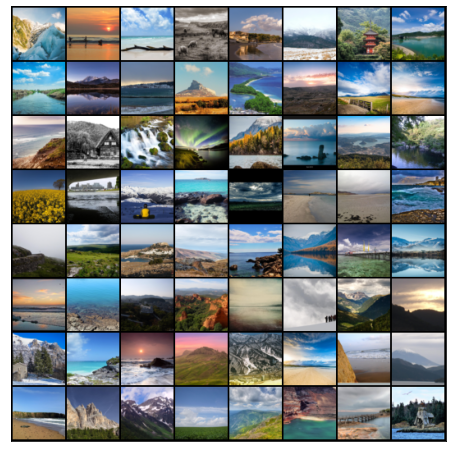

In [24]:
show_batch(train_dl)


In [25]:
def get_default_device():
    
    if torch.cuda.is_available:
        return torch.device('cuda')
    else:
        return torch.device('cpu')

In [26]:
def to_device(data, device):
    
    if isinstance(data, (list, tuple)):
        return [to_device(each, device) for each in data]
    else:
        return data.to(device, non_blocking = True)

In [27]:
class DeviceDataLoader():
    
    def __init__(self, dl, device):
        
        self.dl = dl
        self.device = device
        
    def __iter__(self):
        
        for b in self.dl:
            yield to_device(b, self.device)
            
    def __len__(self):
        
        return len(self.dl)    

In [28]:
device = get_default_device()

train_dl = DeviceDataLoader(train_dl, device)

Build Discriminator

In [29]:
discriminator = nn.Sequential(

    #initial dim : 3 x 64 x 64
    nn.Conv2d(3, 64, kernel_size = 4, stride = 2, padding = 1, bias = False),
    nn.BatchNorm2d(64),
    nn.LeakyReLU(0.2, inplace = True),
    
    #dim : 64 x 32 x 32
    nn.Conv2d(64, 128, kernel_size = 4, stride = 2, padding = 1, bias = False),
    nn.BatchNorm2d(128),
    nn.LeakyReLU(0.2, inplace = True),
    
    #dim : 128 x 16 x 16
    nn.Conv2d(128, 256, kernel_size = 4, stride = 2, padding = 1, bias = False),
    nn.BatchNorm2d(256),
    nn.LeakyReLU(0.2, inplace = True),
    
    #dim : 256 x 8 x 8
    nn.Conv2d(256, 512, kernel_size = 4, stride = 2, padding = 1, bias = False),
    nn.BatchNorm2d(512),
    nn.LeakyReLU(0.2, inplace = True),
    
    #dim : 512 x 4 x 4
    nn.Conv2d(512, 1, kernel_size = 4, stride = 1, padding = 0, bias = False),
    
    #dim : 1 x 1 x 1
    nn.Flatten(),
    nn.Sigmoid()
    
)

In [30]:
discriminator = to_device(discriminator, device)


In [31]:
latent_size = 128


Build Generator

In [32]:
generator = nn.Sequential(

    #initial dim : latent_size x 1 x 1
    nn.ConvTranspose2d(latent_size, 512, kernel_size = 4, stride = 1, padding = 0, bias = False),
    nn.BatchNorm2d(512),
    nn.ReLU(True),
    
    #dim : 512 x 4 x 4
    nn.ConvTranspose2d(512, 256, kernel_size = 4, stride = 2, padding = 1, bias = False),
    nn.BatchNorm2d(256),
    nn.ReLU(True),

    #dim : 256 x 8 x 8
    nn.ConvTranspose2d(256, 128, kernel_size = 4, stride = 2, padding = 1, bias = False),
    nn.BatchNorm2d(128),
    nn.ReLU(True),
    
    #dim : 128 x 16 x 16
    nn.ConvTranspose2d(128, 64, kernel_size = 4, stride = 2, padding = 1, bias = False),
    nn.BatchNorm2d(64),
    nn.ReLU(True),
    
    #dim : 64 x 32 x 32
    nn.ConvTranspose2d(64, 3, kernel_size = 4, stride = 2, padding = 1, bias = False),
    nn.Tanh()
)

torch.Size([128, 3, 64, 64])


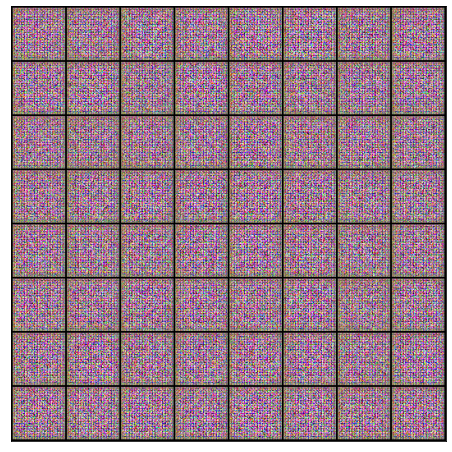

In [33]:
xb = torch.randn(batch_size, latent_size, 1, 1)
fake_images = generator(xb)

print(fake_images.shape)
show_images(fake_images)

In [34]:
generator = to_device(generator, device)


Train Discriminator and Generator

In [35]:
def train_discriminator(real_images, opt_d):
    
    opt_d.zero_grad()
    
    real_preds = discriminator(real_images)
    real_targets = torch.ones(real_images.size(0), 1, device = device)
    real_loss = F.binary_cross_entropy(real_preds, real_targets)
    real_score = torch.mean(real_preds).item()
    
    latent = torch.randn(batch_size, latent_size, 1, 1, device = device)
    fake_images = generator(latent)
    
    fake_preds = discriminator(fake_images)
    fake_targets = torch.zeros(fake_images.size(0), 1, device = device)
    fake_loss = F.binary_cross_entropy(fake_preds, fake_targets)
    fake_score = torch.mean(fake_preds).item()
    
    loss = real_loss + fake_loss
    loss.backward()
    opt_d.step()
    
    return loss.item(), real_score, fake_score


In [36]:
def train_generator(opt_g):
    
    opt_g.zero_grad()
    
    
    latent = torch.randn(batch_size, latent_size, 1, 1, device = device)
    fake_images = generator(latent)
    
    fake_preds = discriminator(fake_images)
    targets = torch.ones(fake_images.size(0), 1, device = device)
    loss = F.binary_cross_entropy(fake_preds, targets)
    
    loss.backward()
    opt_g.step()
    
    return loss.item()


In [37]:
sample_dir = 'generated'
os.makedirs(sample_dir, exist_ok=True)

In [38]:
def save_samples(index, latent_tensors, show = True):
    
    fake_images = generator(latent_tensors)
    fake_fname = 'generated-images-{0:0=4d}.png'.format(index)
    save_image(denorm(fake_images), os.path.join(sample_dir, fake_fname), nrow=8)
    print('Saving', fake_fname)
    if show:
        fig, ax = plt.subplots(figsize=(8, 8))
        ax.set_xticks([]); ax.set_yticks([])
        ax.imshow(make_grid(fake_images.cpu().detach(), nrow=8).permute(1, 2, 0))

In [39]:
fixed_latent = torch.randn(64, latent_size, 1, 1, device=device)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Saving generated-images-0000.png


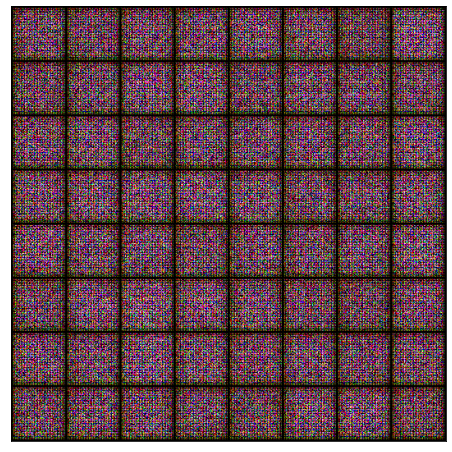

In [40]:
save_samples(0, fixed_latent)

Run GAN

In [41]:
def fit(epochs, lr, start_idx = 1):
    
    torch.cuda.empty_cache()
    
    losses_g = []
    losses_d = []
    real_scores = []
    fake_scores = []
    
    opt_d = torch.optim.Adam(discriminator.parameters(), lr = lr, betas = (0.5, 0.999)) 
    opt_g = torch.optim.Adam(generator.parameters(), lr = lr, betas = (0.5, 0.999)) 
    
    for epoch in range(epochs):
        
        for real_images,_ in tqdm(train_dl):
            
            loss_d, real_score, fake_score = train_discriminator(real_images, opt_d)
            
            loss_g = train_generator(opt_g)
            
        losses_g.append(loss_g)
        losses_d.append(loss_d)
        real_scores.append(real_score)
        fake_scores.append(fake_score)

        print("Epoch [{}/{}], loss_g: {:.4f}, loss_d: {:.4f}, real_score: {:.4f}, fake_score: {:.4f}".format(
        epoch+1, epochs, loss_g, loss_d, real_score, fake_score))

        save_samples(epoch+start_idx, fixed_latent, show=False)
        
    return losses_g, losses_d, real_scores, fake_scores


In [42]:
lr = 0.0002
epochs = 500 # x gan hours

In [43]:
history = fit(epochs, lr)

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [1/500], loss_g: 13.1035, loss_d: 0.1316, real_score: 0.8935, fake_score: 0.0000
Saving generated-images-0001.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [2/500], loss_g: 7.8808, loss_d: 2.6323, real_score: 0.9431, fake_score: 0.8911
Saving generated-images-0002.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [3/500], loss_g: 3.2538, loss_d: 0.3397, real_score: 0.8102, fake_score: 0.1002
Saving generated-images-0003.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [4/500], loss_g: 2.9076, loss_d: 0.3291, real_score: 0.8782, fake_score: 0.1735
Saving generated-images-0004.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [5/500], loss_g: 4.9989, loss_d: 1.1009, real_score: 0.8941, fake_score: 0.5833
Saving generated-images-0005.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [6/500], loss_g: 1.3792, loss_d: 0.9183, real_score: 0.4737, fake_score: 0.0384
Saving generated-images-0006.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [7/500], loss_g: 2.7503, loss_d: 0.6592, real_score: 0.7858, fake_score: 0.3163
Saving generated-images-0007.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [8/500], loss_g: 2.1721, loss_d: 2.0385, real_score: 0.2048, fake_score: 0.0057
Saving generated-images-0008.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [9/500], loss_g: 2.5681, loss_d: 0.4708, real_score: 0.7289, fake_score: 0.0990
Saving generated-images-0009.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [10/500], loss_g: 2.7004, loss_d: 0.2862, real_score: 0.8757, fake_score: 0.1325
Saving generated-images-0010.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [11/500], loss_g: 3.6455, loss_d: 0.3064, real_score: 0.9082, fake_score: 0.1780
Saving generated-images-0011.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [12/500], loss_g: 3.1822, loss_d: 0.4398, real_score: 0.8509, fake_score: 0.2153
Saving generated-images-0012.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [13/500], loss_g: 2.9393, loss_d: 0.4504, real_score: 0.8027, fake_score: 0.1776
Saving generated-images-0013.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [14/500], loss_g: 5.5540, loss_d: 1.6009, real_score: 0.9734, fake_score: 0.7511
Saving generated-images-0014.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [15/500], loss_g: 0.9732, loss_d: 0.8862, real_score: 0.4971, fake_score: 0.0913
Saving generated-images-0015.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [16/500], loss_g: 2.8385, loss_d: 0.5384, real_score: 0.7611, fake_score: 0.2006
Saving generated-images-0016.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [17/500], loss_g: 6.4637, loss_d: 1.1525, real_score: 0.9548, fake_score: 0.6399
Saving generated-images-0017.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [18/500], loss_g: 2.4683, loss_d: 0.5136, real_score: 0.7269, fake_score: 0.1456
Saving generated-images-0018.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [19/500], loss_g: 4.9943, loss_d: 0.7111, real_score: 0.8465, fake_score: 0.3910
Saving generated-images-0019.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [20/500], loss_g: 2.7375, loss_d: 0.4278, real_score: 0.7530, fake_score: 0.0976
Saving generated-images-0020.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [21/500], loss_g: 1.9234, loss_d: 1.2244, real_score: 0.3921, fake_score: 0.0172
Saving generated-images-0021.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [22/500], loss_g: 2.1635, loss_d: 2.3273, real_score: 0.1455, fake_score: 0.0066
Saving generated-images-0022.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [23/500], loss_g: 3.2165, loss_d: 0.4298, real_score: 0.7510, fake_score: 0.1031
Saving generated-images-0023.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [24/500], loss_g: 3.1428, loss_d: 0.7034, real_score: 0.7587, fake_score: 0.3106
Saving generated-images-0024.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [25/500], loss_g: 3.2547, loss_d: 0.5031, real_score: 0.8719, fake_score: 0.2817
Saving generated-images-0025.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [26/500], loss_g: 4.0873, loss_d: 0.6817, real_score: 0.8169, fake_score: 0.3431
Saving generated-images-0026.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [27/500], loss_g: 4.2678, loss_d: 0.5254, real_score: 0.8885, fake_score: 0.3169
Saving generated-images-0027.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [28/500], loss_g: 2.6899, loss_d: 2.4813, real_score: 0.1216, fake_score: 0.0020
Saving generated-images-0028.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [29/500], loss_g: 3.4452, loss_d: 0.4728, real_score: 0.8112, fake_score: 0.2135
Saving generated-images-0029.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [30/500], loss_g: 2.4264, loss_d: 0.5811, real_score: 0.7009, fake_score: 0.1545
Saving generated-images-0030.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [31/500], loss_g: 4.3092, loss_d: 0.4660, real_score: 0.8904, fake_score: 0.2787
Saving generated-images-0031.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [32/500], loss_g: 0.9716, loss_d: 0.8350, real_score: 0.4944, fake_score: 0.0441
Saving generated-images-0032.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [33/500], loss_g: 3.2742, loss_d: 0.3910, real_score: 0.9338, fake_score: 0.2554
Saving generated-images-0033.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [34/500], loss_g: 2.1226, loss_d: 0.7403, real_score: 0.5461, fake_score: 0.0409
Saving generated-images-0034.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [35/500], loss_g: 2.9779, loss_d: 0.3872, real_score: 0.8076, fake_score: 0.1286
Saving generated-images-0035.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [36/500], loss_g: 2.9888, loss_d: 0.3456, real_score: 0.7906, fake_score: 0.0802
Saving generated-images-0036.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [37/500], loss_g: 5.5180, loss_d: 0.3993, real_score: 0.9235, fake_score: 0.2499
Saving generated-images-0037.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [38/500], loss_g: 2.7385, loss_d: 0.5363, real_score: 0.6503, fake_score: 0.0603
Saving generated-images-0038.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [39/500], loss_g: 4.9039, loss_d: 0.4955, real_score: 0.9444, fake_score: 0.3206
Saving generated-images-0039.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [40/500], loss_g: 7.0855, loss_d: 0.9477, real_score: 0.9812, fake_score: 0.5488
Saving generated-images-0040.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [41/500], loss_g: 4.2936, loss_d: 0.4920, real_score: 0.8109, fake_score: 0.2177
Saving generated-images-0041.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [42/500], loss_g: 3.1118, loss_d: 0.2579, real_score: 0.8455, fake_score: 0.0777
Saving generated-images-0042.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [43/500], loss_g: 1.7450, loss_d: 0.8766, real_score: 0.4669, fake_score: 0.0186
Saving generated-images-0043.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [44/500], loss_g: 5.7552, loss_d: 0.4136, real_score: 0.9275, fake_score: 0.2463
Saving generated-images-0044.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [45/500], loss_g: 2.3439, loss_d: 0.5217, real_score: 0.6494, fake_score: 0.0384
Saving generated-images-0045.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [46/500], loss_g: 6.6794, loss_d: 0.8530, real_score: 0.9709, fake_score: 0.5126
Saving generated-images-0046.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [47/500], loss_g: 3.1844, loss_d: 0.2643, real_score: 0.9077, fake_score: 0.1325
Saving generated-images-0047.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [48/500], loss_g: 4.4889, loss_d: 0.3911, real_score: 0.9420, fake_score: 0.2570
Saving generated-images-0048.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [49/500], loss_g: 3.2907, loss_d: 0.5037, real_score: 0.6436, fake_score: 0.0128
Saving generated-images-0049.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [50/500], loss_g: 3.6757, loss_d: 0.4009, real_score: 0.8498, fake_score: 0.1914
Saving generated-images-0050.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [51/500], loss_g: 5.1754, loss_d: 0.5851, real_score: 0.9240, fake_score: 0.3600
Saving generated-images-0051.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [52/500], loss_g: 1.5646, loss_d: 0.6626, real_score: 0.5880, fake_score: 0.0505
Saving generated-images-0052.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [53/500], loss_g: 2.2879, loss_d: 0.4942, real_score: 0.7805, fake_score: 0.1861
Saving generated-images-0053.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [54/500], loss_g: 6.4527, loss_d: 0.8785, real_score: 0.9927, fake_score: 0.5344
Saving generated-images-0054.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [55/500], loss_g: 3.0988, loss_d: 0.5890, real_score: 0.7910, fake_score: 0.2606
Saving generated-images-0055.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [56/500], loss_g: 6.5254, loss_d: 0.6157, real_score: 0.9273, fake_score: 0.3789
Saving generated-images-0056.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [57/500], loss_g: 3.3392, loss_d: 0.3775, real_score: 0.7481, fake_score: 0.0453
Saving generated-images-0057.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [58/500], loss_g: 3.2137, loss_d: 0.3539, real_score: 0.8802, fake_score: 0.1834
Saving generated-images-0058.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [59/500], loss_g: 3.5862, loss_d: 0.2890, real_score: 0.9200, fake_score: 0.1695
Saving generated-images-0059.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [60/500], loss_g: 4.2132, loss_d: 0.3650, real_score: 0.9604, fake_score: 0.2476
Saving generated-images-0060.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [61/500], loss_g: 1.2054, loss_d: 2.9532, real_score: 0.0901, fake_score: 0.0023
Saving generated-images-0061.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [62/500], loss_g: 2.4251, loss_d: 0.3744, real_score: 0.8188, fake_score: 0.1366
Saving generated-images-0062.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [63/500], loss_g: 1.9475, loss_d: 0.7469, real_score: 0.5372, fake_score: 0.0233
Saving generated-images-0063.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [64/500], loss_g: 6.7007, loss_d: 0.7978, real_score: 0.9644, fake_score: 0.4850
Saving generated-images-0064.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [65/500], loss_g: 4.3822, loss_d: 0.5002, real_score: 0.9198, fake_score: 0.3115
Saving generated-images-0065.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [66/500], loss_g: 3.3290, loss_d: 0.1976, real_score: 0.9597, fake_score: 0.1355
Saving generated-images-0066.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [67/500], loss_g: 2.7368, loss_d: 0.4309, real_score: 0.7944, fake_score: 0.1621
Saving generated-images-0067.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [68/500], loss_g: 3.3385, loss_d: 0.3013, real_score: 0.8317, fake_score: 0.0954
Saving generated-images-0068.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [69/500], loss_g: 4.6888, loss_d: 0.2881, real_score: 0.9125, fake_score: 0.1677
Saving generated-images-0069.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [70/500], loss_g: 3.7601, loss_d: 0.2379, real_score: 0.8901, fake_score: 0.0965
Saving generated-images-0070.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [71/500], loss_g: 3.4758, loss_d: 0.3509, real_score: 0.8762, fake_score: 0.1733
Saving generated-images-0071.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [72/500], loss_g: 5.2564, loss_d: 0.2113, real_score: 0.9232, fake_score: 0.1135
Saving generated-images-0072.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [73/500], loss_g: 3.8124, loss_d: 0.1864, real_score: 0.9133, fake_score: 0.0844
Saving generated-images-0073.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [74/500], loss_g: 3.7278, loss_d: 0.2783, real_score: 0.9280, fake_score: 0.1709
Saving generated-images-0074.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [75/500], loss_g: 6.6922, loss_d: 0.6308, real_score: 0.9813, fake_score: 0.4186
Saving generated-images-0075.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [76/500], loss_g: 4.2203, loss_d: 0.2319, real_score: 0.8697, fake_score: 0.0767
Saving generated-images-0076.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [77/500], loss_g: 3.4125, loss_d: 0.2802, real_score: 0.8639, fake_score: 0.1133
Saving generated-images-0077.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [78/500], loss_g: 3.6593, loss_d: 0.3113, real_score: 0.7747, fake_score: 0.0242
Saving generated-images-0078.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [79/500], loss_g: 3.3036, loss_d: 0.2706, real_score: 0.8560, fake_score: 0.0961
Saving generated-images-0079.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [80/500], loss_g: 3.8168, loss_d: 0.2600, real_score: 0.8185, fake_score: 0.0265
Saving generated-images-0080.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [81/500], loss_g: 2.4190, loss_d: 0.3518, real_score: 0.8350, fake_score: 0.1431
Saving generated-images-0081.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [82/500], loss_g: 4.5690, loss_d: 0.2861, real_score: 0.9069, fake_score: 0.1496
Saving generated-images-0082.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [83/500], loss_g: 4.1423, loss_d: 0.5512, real_score: 0.7935, fake_score: 0.2112
Saving generated-images-0083.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [84/500], loss_g: 4.4693, loss_d: 0.4528, real_score: 0.9504, fake_score: 0.3051
Saving generated-images-0084.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [85/500], loss_g: 4.1654, loss_d: 0.2644, real_score: 0.9508, fake_score: 0.1824
Saving generated-images-0085.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [86/500], loss_g: 3.0978, loss_d: 0.3461, real_score: 0.7529, fake_score: 0.0350
Saving generated-images-0086.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [87/500], loss_g: 3.6849, loss_d: 0.8906, real_score: 0.5057, fake_score: 0.0048
Saving generated-images-0087.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [88/500], loss_g: 3.7888, loss_d: 0.2168, real_score: 0.9158, fake_score: 0.1122
Saving generated-images-0088.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [89/500], loss_g: 2.2193, loss_d: 0.2932, real_score: 0.8072, fake_score: 0.0577
Saving generated-images-0089.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [90/500], loss_g: 3.9266, loss_d: 0.1684, real_score: 0.9572, fake_score: 0.1070
Saving generated-images-0090.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [91/500], loss_g: 3.6533, loss_d: 0.2095, real_score: 0.8925, fake_score: 0.0835
Saving generated-images-0091.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [92/500], loss_g: 3.1752, loss_d: 1.1773, real_score: 0.3818, fake_score: 0.0031
Saving generated-images-0092.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [93/500], loss_g: 3.6338, loss_d: 0.2704, real_score: 0.8339, fake_score: 0.0660
Saving generated-images-0093.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [94/500], loss_g: 5.5191, loss_d: 0.4361, real_score: 0.9844, fake_score: 0.3213
Saving generated-images-0094.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [95/500], loss_g: 1.6436, loss_d: 0.6009, real_score: 0.6129, fake_score: 0.0046
Saving generated-images-0095.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [96/500], loss_g: 3.1652, loss_d: 0.3050, real_score: 0.8739, fake_score: 0.1440
Saving generated-images-0096.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [97/500], loss_g: 3.3655, loss_d: 0.4512, real_score: 0.6813, fake_score: 0.0086
Saving generated-images-0097.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [98/500], loss_g: 1.7088, loss_d: 0.2656, real_score: 0.8227, fake_score: 0.0580
Saving generated-images-0098.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [99/500], loss_g: 5.1354, loss_d: 0.4620, real_score: 0.9386, fake_score: 0.2943
Saving generated-images-0099.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [100/500], loss_g: 5.5862, loss_d: 0.5386, real_score: 0.9359, fake_score: 0.3193
Saving generated-images-0100.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [101/500], loss_g: 3.6054, loss_d: 0.1781, real_score: 0.9083, fake_score: 0.0720
Saving generated-images-0101.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [102/500], loss_g: 3.2921, loss_d: 0.1823, real_score: 0.8921, fake_score: 0.0590
Saving generated-images-0102.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [103/500], loss_g: 8.8120, loss_d: 1.8637, real_score: 0.9960, fake_score: 0.7384
Saving generated-images-0103.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [104/500], loss_g: 2.0356, loss_d: 0.4306, real_score: 0.7121, fake_score: 0.0435
Saving generated-images-0104.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [105/500], loss_g: 2.5932, loss_d: 0.1979, real_score: 0.8830, fake_score: 0.0558
Saving generated-images-0105.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [106/500], loss_g: 4.7178, loss_d: 0.3184, real_score: 0.9608, fake_score: 0.2246
Saving generated-images-0106.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [107/500], loss_g: 3.1902, loss_d: 0.2018, real_score: 0.9455, fake_score: 0.1257
Saving generated-images-0107.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [108/500], loss_g: 3.2442, loss_d: 0.2214, real_score: 0.9089, fake_score: 0.1086
Saving generated-images-0108.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [109/500], loss_g: 8.9362, loss_d: 0.7899, real_score: 0.9947, fake_score: 0.4843
Saving generated-images-0109.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [110/500], loss_g: 2.5917, loss_d: 0.4754, real_score: 0.7600, fake_score: 0.1298
Saving generated-images-0110.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [111/500], loss_g: 2.7877, loss_d: 0.3613, real_score: 0.7561, fake_score: 0.0508
Saving generated-images-0111.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [112/500], loss_g: 3.2175, loss_d: 0.1736, real_score: 0.9627, fake_score: 0.1197
Saving generated-images-0112.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [113/500], loss_g: 4.6775, loss_d: 0.3973, real_score: 0.9294, fake_score: 0.2418
Saving generated-images-0113.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [114/500], loss_g: 4.4619, loss_d: 0.1362, real_score: 0.9554, fake_score: 0.0818
Saving generated-images-0114.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [115/500], loss_g: 4.4565, loss_d: 0.1077, real_score: 0.9212, fake_score: 0.0226
Saving generated-images-0115.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [116/500], loss_g: 3.7255, loss_d: 0.5428, real_score: 0.6362, fake_score: 0.0174
Saving generated-images-0116.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [117/500], loss_g: 2.9237, loss_d: 0.2367, real_score: 0.8411, fake_score: 0.0487
Saving generated-images-0117.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [118/500], loss_g: 4.5923, loss_d: 0.1680, real_score: 0.9422, fake_score: 0.0986
Saving generated-images-0118.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [119/500], loss_g: 5.7957, loss_d: 0.3430, real_score: 0.9875, fake_score: 0.2597
Saving generated-images-0119.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [120/500], loss_g: 4.3815, loss_d: 0.1219, real_score: 0.9410, fake_score: 0.0567
Saving generated-images-0120.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [121/500], loss_g: 4.4706, loss_d: 0.2430, real_score: 0.8953, fake_score: 0.1053
Saving generated-images-0121.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [122/500], loss_g: 2.9951, loss_d: 0.1376, real_score: 0.9484, fake_score: 0.0769
Saving generated-images-0122.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [123/500], loss_g: 3.0047, loss_d: 0.4983, real_score: 0.7537, fake_score: 0.1168
Saving generated-images-0123.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [124/500], loss_g: 3.3137, loss_d: 0.2718, real_score: 0.8753, fake_score: 0.1170
Saving generated-images-0124.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [125/500], loss_g: 3.2077, loss_d: 0.1683, real_score: 0.9322, fake_score: 0.0857
Saving generated-images-0125.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [126/500], loss_g: 4.8079, loss_d: 0.2324, real_score: 0.8421, fake_score: 0.0121
Saving generated-images-0126.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [127/500], loss_g: 4.8688, loss_d: 0.1436, real_score: 0.8979, fake_score: 0.0301
Saving generated-images-0127.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [128/500], loss_g: 4.0732, loss_d: 0.1871, real_score: 0.9569, fake_score: 0.1254
Saving generated-images-0128.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [129/500], loss_g: 2.4689, loss_d: 0.1815, real_score: 0.8876, fake_score: 0.0536
Saving generated-images-0129.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [130/500], loss_g: 5.7030, loss_d: 0.1672, real_score: 0.9164, fake_score: 0.0668
Saving generated-images-0130.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [131/500], loss_g: 4.1019, loss_d: 0.1120, real_score: 0.9676, fake_score: 0.0719
Saving generated-images-0131.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [132/500], loss_g: 4.2778, loss_d: 0.3496, real_score: 0.7822, fake_score: 0.0520
Saving generated-images-0132.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [133/500], loss_g: 2.2441, loss_d: 0.2924, real_score: 0.8399, fake_score: 0.0913
Saving generated-images-0133.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [134/500], loss_g: 4.4693, loss_d: 0.1144, real_score: 0.9382, fake_score: 0.0459
Saving generated-images-0134.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [135/500], loss_g: 2.7812, loss_d: 0.2518, real_score: 0.8387, fake_score: 0.0598
Saving generated-images-0135.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [136/500], loss_g: 4.0654, loss_d: 0.1645, real_score: 0.9547, fake_score: 0.1055
Saving generated-images-0136.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [137/500], loss_g: 3.7090, loss_d: 0.1687, real_score: 0.9069, fake_score: 0.0610
Saving generated-images-0137.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [138/500], loss_g: 3.1102, loss_d: 0.1348, real_score: 0.9109, fake_score: 0.0375
Saving generated-images-0138.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [139/500], loss_g: 3.0911, loss_d: 0.4957, real_score: 0.6695, fake_score: 0.0411
Saving generated-images-0139.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [140/500], loss_g: 3.7512, loss_d: 0.2176, real_score: 0.9083, fake_score: 0.1051
Saving generated-images-0140.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [141/500], loss_g: 3.5094, loss_d: 0.1935, real_score: 0.9694, fake_score: 0.1416
Saving generated-images-0141.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [142/500], loss_g: 3.7718, loss_d: 0.1938, real_score: 0.8597, fake_score: 0.0299
Saving generated-images-0142.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [143/500], loss_g: 3.8468, loss_d: 0.1273, real_score: 0.9184, fake_score: 0.0372
Saving generated-images-0143.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [144/500], loss_g: 4.3601, loss_d: 0.1392, real_score: 0.9883, fake_score: 0.1076
Saving generated-images-0144.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [145/500], loss_g: 4.8262, loss_d: 0.1185, real_score: 0.9704, fake_score: 0.0805
Saving generated-images-0145.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [146/500], loss_g: 1.1099, loss_d: 0.7322, real_score: 0.5966, fake_score: 0.1064
Saving generated-images-0146.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [147/500], loss_g: 3.1616, loss_d: 0.5175, real_score: 0.7898, fake_score: 0.1911
Saving generated-images-0147.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [148/500], loss_g: 2.2610, loss_d: 0.2597, real_score: 0.8102, fake_score: 0.0289
Saving generated-images-0148.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [149/500], loss_g: 4.0833, loss_d: 0.1860, real_score: 0.9604, fake_score: 0.1256
Saving generated-images-0149.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [150/500], loss_g: 5.3607, loss_d: 0.1147, real_score: 0.9139, fake_score: 0.0205
Saving generated-images-0150.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [151/500], loss_g: 4.1514, loss_d: 0.1475, real_score: 0.9695, fake_score: 0.1045
Saving generated-images-0151.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [152/500], loss_g: 4.2094, loss_d: 0.1144, real_score: 0.9072, fake_score: 0.0130
Saving generated-images-0152.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [153/500], loss_g: 3.0101, loss_d: 0.0874, real_score: 0.9623, fake_score: 0.0458
Saving generated-images-0153.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [154/500], loss_g: 3.3620, loss_d: 0.2225, real_score: 0.8415, fake_score: 0.0271
Saving generated-images-0154.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [155/500], loss_g: 3.9017, loss_d: 0.1065, real_score: 0.9169, fake_score: 0.0173
Saving generated-images-0155.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [156/500], loss_g: 3.5609, loss_d: 0.2108, real_score: 0.8633, fake_score: 0.0513
Saving generated-images-0156.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [157/500], loss_g: 3.3295, loss_d: 0.1309, real_score: 0.9129, fake_score: 0.0357
Saving generated-images-0157.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [158/500], loss_g: 3.2346, loss_d: 0.7144, real_score: 0.7763, fake_score: 0.2605
Saving generated-images-0158.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [159/500], loss_g: 3.9184, loss_d: 0.1889, real_score: 0.8870, fake_score: 0.0547
Saving generated-images-0159.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [160/500], loss_g: 3.2805, loss_d: 0.1767, real_score: 0.8760, fake_score: 0.0351
Saving generated-images-0160.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [161/500], loss_g: 4.6256, loss_d: 0.1384, real_score: 0.9757, fake_score: 0.1033
Saving generated-images-0161.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [162/500], loss_g: 2.9614, loss_d: 0.1386, real_score: 0.9090, fake_score: 0.0378
Saving generated-images-0162.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [163/500], loss_g: 3.1322, loss_d: 0.1527, real_score: 0.8844, fake_score: 0.0233
Saving generated-images-0163.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [164/500], loss_g: 4.4545, loss_d: 0.0629, real_score: 0.9779, fake_score: 0.0381
Saving generated-images-0164.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [165/500], loss_g: 2.6543, loss_d: 1.4516, real_score: 0.3758, fake_score: 0.0357
Saving generated-images-0165.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [166/500], loss_g: 3.3099, loss_d: 0.2480, real_score: 0.8297, fake_score: 0.0426
Saving generated-images-0166.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [167/500], loss_g: 3.5627, loss_d: 0.1229, real_score: 0.9263, fake_score: 0.0417
Saving generated-images-0167.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [168/500], loss_g: 4.1277, loss_d: 0.0844, real_score: 0.9568, fake_score: 0.0375
Saving generated-images-0168.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [169/500], loss_g: 4.5530, loss_d: 0.2366, real_score: 0.9534, fake_score: 0.1515
Saving generated-images-0169.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [170/500], loss_g: 4.3517, loss_d: 0.0966, real_score: 0.9592, fake_score: 0.0501
Saving generated-images-0170.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [171/500], loss_g: 3.3865, loss_d: 0.1822, real_score: 0.8662, fake_score: 0.0293
Saving generated-images-0171.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [172/500], loss_g: 2.9866, loss_d: 0.2432, real_score: 0.8117, fake_score: 0.0196
Saving generated-images-0172.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [173/500], loss_g: 3.4764, loss_d: 0.1490, real_score: 0.9490, fake_score: 0.0824
Saving generated-images-0173.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [174/500], loss_g: 4.3240, loss_d: 0.0680, real_score: 0.9698, fake_score: 0.0352
Saving generated-images-0174.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [175/500], loss_g: 4.8587, loss_d: 0.0545, real_score: 0.9660, fake_score: 0.0190
Saving generated-images-0175.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [176/500], loss_g: 4.8698, loss_d: 0.0528, real_score: 0.9722, fake_score: 0.0236
Saving generated-images-0176.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [177/500], loss_g: 4.3440, loss_d: 0.1342, real_score: 0.9256, fake_score: 0.0495
Saving generated-images-0177.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [178/500], loss_g: 4.3397, loss_d: 0.0865, real_score: 0.9440, fake_score: 0.0265
Saving generated-images-0178.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [179/500], loss_g: 4.0181, loss_d: 1.8945, real_score: 0.9340, fake_score: 0.7319
Saving generated-images-0179.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [180/500], loss_g: 3.8151, loss_d: 0.3302, real_score: 0.8229, fake_score: 0.0807
Saving generated-images-0180.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [181/500], loss_g: 4.4386, loss_d: 0.1277, real_score: 0.9302, fake_score: 0.0489
Saving generated-images-0181.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [182/500], loss_g: 3.9329, loss_d: 0.1509, real_score: 0.9714, fake_score: 0.1071
Saving generated-images-0182.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [183/500], loss_g: 4.8312, loss_d: 0.0751, real_score: 0.9662, fake_score: 0.0380
Saving generated-images-0183.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [184/500], loss_g: 4.2687, loss_d: 0.0684, real_score: 0.9666, fake_score: 0.0325
Saving generated-images-0184.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [185/500], loss_g: 3.9205, loss_d: 0.1353, real_score: 0.9426, fake_score: 0.0671
Saving generated-images-0185.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [186/500], loss_g: 4.3488, loss_d: 0.1804, real_score: 0.9853, fake_score: 0.1354
Saving generated-images-0186.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [187/500], loss_g: 3.2014, loss_d: 0.3267, real_score: 0.8251, fake_score: 0.0964
Saving generated-images-0187.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [188/500], loss_g: 6.3789, loss_d: 0.0531, real_score: 0.9671, fake_score: 0.0185
Saving generated-images-0188.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [189/500], loss_g: 2.9929, loss_d: 0.1591, real_score: 0.8813, fake_score: 0.0260
Saving generated-images-0189.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [190/500], loss_g: 4.3189, loss_d: 0.1886, real_score: 0.9706, fake_score: 0.1344
Saving generated-images-0190.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [191/500], loss_g: 3.7437, loss_d: 0.0824, real_score: 0.9674, fake_score: 0.0457
Saving generated-images-0191.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [192/500], loss_g: 4.6601, loss_d: 0.0564, real_score: 0.9827, fake_score: 0.0375
Saving generated-images-0192.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [193/500], loss_g: 4.1968, loss_d: 0.0752, real_score: 0.9466, fake_score: 0.0185
Saving generated-images-0193.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [194/500], loss_g: 5.0514, loss_d: 0.0791, real_score: 0.9984, fake_score: 0.0721
Saving generated-images-0194.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [195/500], loss_g: 2.9382, loss_d: 0.1148, real_score: 0.9083, fake_score: 0.0134
Saving generated-images-0195.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [196/500], loss_g: 4.6575, loss_d: 0.0919, real_score: 0.9863, fake_score: 0.0689
Saving generated-images-0196.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [197/500], loss_g: 4.4772, loss_d: 0.0791, real_score: 0.9915, fake_score: 0.0646
Saving generated-images-0197.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [198/500], loss_g: 6.6748, loss_d: 0.2070, real_score: 0.9900, fake_score: 0.1490
Saving generated-images-0198.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [199/500], loss_g: 4.2078, loss_d: 0.0771, real_score: 0.9480, fake_score: 0.0213
Saving generated-images-0199.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [200/500], loss_g: 4.8775, loss_d: 0.0784, real_score: 0.9721, fake_score: 0.0462
Saving generated-images-0200.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [201/500], loss_g: 3.5912, loss_d: 0.0832, real_score: 0.9385, fake_score: 0.0179
Saving generated-images-0201.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [202/500], loss_g: 4.8985, loss_d: 0.0567, real_score: 0.9756, fake_score: 0.0308
Saving generated-images-0202.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [203/500], loss_g: 4.6260, loss_d: 0.0771, real_score: 0.9459, fake_score: 0.0188
Saving generated-images-0203.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [204/500], loss_g: 4.8307, loss_d: 0.0660, real_score: 0.9896, fake_score: 0.0518
Saving generated-images-0204.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [205/500], loss_g: 4.9357, loss_d: 1.3314, real_score: 0.9703, fake_score: 0.5672
Saving generated-images-0205.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [206/500], loss_g: 2.1069, loss_d: 0.4012, real_score: 0.7419, fake_score: 0.0453
Saving generated-images-0206.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [207/500], loss_g: 4.9997, loss_d: 0.1105, real_score: 0.9517, fake_score: 0.0521
Saving generated-images-0207.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [208/500], loss_g: 4.5230, loss_d: 0.1287, real_score: 0.9746, fake_score: 0.0923
Saving generated-images-0208.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [209/500], loss_g: 5.0327, loss_d: 0.1224, real_score: 0.9036, fake_score: 0.0111
Saving generated-images-0209.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [210/500], loss_g: 3.3356, loss_d: 0.1208, real_score: 0.9271, fake_score: 0.0397
Saving generated-images-0210.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [211/500], loss_g: 4.7770, loss_d: 0.0830, real_score: 0.9700, fake_score: 0.0483
Saving generated-images-0211.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [212/500], loss_g: 2.3825, loss_d: 0.1723, real_score: 0.8596, fake_score: 0.0135
Saving generated-images-0212.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [213/500], loss_g: 4.2915, loss_d: 0.1020, real_score: 0.9412, fake_score: 0.0347
Saving generated-images-0213.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [214/500], loss_g: 4.9235, loss_d: 0.0685, real_score: 0.9476, fake_score: 0.0134
Saving generated-images-0214.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [215/500], loss_g: 4.4678, loss_d: 0.1060, real_score: 0.9477, fake_score: 0.0489
Saving generated-images-0215.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [216/500], loss_g: 5.5366, loss_d: 0.0379, real_score: 0.9728, fake_score: 0.0099
Saving generated-images-0216.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [217/500], loss_g: 4.4131, loss_d: 0.0569, real_score: 0.9963, fake_score: 0.0499
Saving generated-images-0217.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [218/500], loss_g: 4.8336, loss_d: 0.0958, real_score: 0.9888, fake_score: 0.0769
Saving generated-images-0218.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [219/500], loss_g: 5.6607, loss_d: 0.0453, real_score: 0.9816, fake_score: 0.0245
Saving generated-images-0219.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [220/500], loss_g: 3.7735, loss_d: 0.0804, real_score: 0.9457, fake_score: 0.0226
Saving generated-images-0220.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [221/500], loss_g: 3.1666, loss_d: 0.8035, real_score: 0.6683, fake_score: 0.1468
Saving generated-images-0221.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [222/500], loss_g: 3.0787, loss_d: 0.3843, real_score: 0.7862, fake_score: 0.0726
Saving generated-images-0222.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [223/500], loss_g: 2.3889, loss_d: 0.0806, real_score: 0.9725, fake_score: 0.0485
Saving generated-images-0223.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [224/500], loss_g: 4.3180, loss_d: 0.0689, real_score: 0.9497, fake_score: 0.0139
Saving generated-images-0224.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [225/500], loss_g: 4.4951, loss_d: 0.1328, real_score: 0.8978, fake_score: 0.0201
Saving generated-images-0225.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [226/500], loss_g: 4.2545, loss_d: 0.1067, real_score: 0.9488, fake_score: 0.0491
Saving generated-images-0226.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [227/500], loss_g: 4.1029, loss_d: 0.0895, real_score: 0.9402, fake_score: 0.0248
Saving generated-images-0227.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [228/500], loss_g: 4.3534, loss_d: 0.0556, real_score: 0.9845, fake_score: 0.0379
Saving generated-images-0228.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [229/500], loss_g: 5.0224, loss_d: 0.0811, real_score: 0.9910, fake_score: 0.0650
Saving generated-images-0229.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [230/500], loss_g: 3.6239, loss_d: 0.0586, real_score: 0.9904, fake_score: 0.0463
Saving generated-images-0230.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [231/500], loss_g: 5.0271, loss_d: 0.0652, real_score: 0.9542, fake_score: 0.0172
Saving generated-images-0231.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [232/500], loss_g: 5.0725, loss_d: 0.0610, real_score: 0.9795, fake_score: 0.0384
Saving generated-images-0232.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [233/500], loss_g: 4.4292, loss_d: 0.0944, real_score: 0.9782, fake_score: 0.0649
Saving generated-images-0233.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [234/500], loss_g: 5.0328, loss_d: 0.0207, real_score: 0.9938, fake_score: 0.0143
Saving generated-images-0234.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [235/500], loss_g: 4.5924, loss_d: 0.0665, real_score: 0.9493, fake_score: 0.0134
Saving generated-images-0235.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [236/500], loss_g: 5.4029, loss_d: 0.1070, real_score: 0.9967, fake_score: 0.0916
Saving generated-images-0236.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [237/500], loss_g: 3.5186, loss_d: 0.0920, real_score: 0.9359, fake_score: 0.0230
Saving generated-images-0237.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [238/500], loss_g: 5.6904, loss_d: 0.0450, real_score: 0.9757, fake_score: 0.0195
Saving generated-images-0238.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [239/500], loss_g: 3.8261, loss_d: 0.0775, real_score: 0.9840, fake_score: 0.0544
Saving generated-images-0239.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [240/500], loss_g: 3.6140, loss_d: 0.1017, real_score: 0.9198, fake_score: 0.0146
Saving generated-images-0240.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [241/500], loss_g: 2.2426, loss_d: 0.1423, real_score: 0.8900, fake_score: 0.0204
Saving generated-images-0241.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [242/500], loss_g: 4.8991, loss_d: 0.0205, real_score: 0.9918, fake_score: 0.0120
Saving generated-images-0242.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [243/500], loss_g: 3.9716, loss_d: 0.0535, real_score: 0.9825, fake_score: 0.0342
Saving generated-images-0243.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [244/500], loss_g: 5.0055, loss_d: 0.0322, real_score: 0.9970, fake_score: 0.0279
Saving generated-images-0244.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [245/500], loss_g: 4.5520, loss_d: 0.0603, real_score: 0.9649, fake_score: 0.0231
Saving generated-images-0245.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [246/500], loss_g: 4.7799, loss_d: 0.0560, real_score: 0.9571, fake_score: 0.0112
Saving generated-images-0246.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [247/500], loss_g: 2.0569, loss_d: 2.0621, real_score: 0.7823, fake_score: 0.7136
Saving generated-images-0247.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [248/500], loss_g: 1.2297, loss_d: 1.2629, real_score: 0.5100, fake_score: 0.3472
Saving generated-images-0248.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [249/500], loss_g: 2.0110, loss_d: 1.6810, real_score: 0.8337, fake_score: 0.6848
Saving generated-images-0249.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [250/500], loss_g: 2.3970, loss_d: 0.7387, real_score: 0.7013, fake_score: 0.2323
Saving generated-images-0250.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [251/500], loss_g: 3.1727, loss_d: 0.9503, real_score: 0.5411, fake_score: 0.0479
Saving generated-images-0251.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [252/500], loss_g: 4.2480, loss_d: 0.3200, real_score: 0.9163, fake_score: 0.1639
Saving generated-images-0252.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [253/500], loss_g: 4.4656, loss_d: 0.3364, real_score: 0.7604, fake_score: 0.0092
Saving generated-images-0253.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [254/500], loss_g: 4.6760, loss_d: 0.1981, real_score: 0.9866, fake_score: 0.1468
Saving generated-images-0254.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [255/500], loss_g: 4.5404, loss_d: 0.0657, real_score: 0.9653, fake_score: 0.0269
Saving generated-images-0255.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [256/500], loss_g: 4.4856, loss_d: 0.0698, real_score: 0.9876, fake_score: 0.0530
Saving generated-images-0256.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [257/500], loss_g: 4.3560, loss_d: 0.1615, real_score: 0.8689, fake_score: 0.0105
Saving generated-images-0257.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [258/500], loss_g: 4.4131, loss_d: 0.0463, real_score: 0.9744, fake_score: 0.0194
Saving generated-images-0258.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [259/500], loss_g: 5.4021, loss_d: 0.0557, real_score: 0.9533, fake_score: 0.0067
Saving generated-images-0259.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [260/500], loss_g: 2.5770, loss_d: 0.6541, real_score: 0.6621, fake_score: 0.1086
Saving generated-images-0260.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [261/500], loss_g: 4.5906, loss_d: 0.0605, real_score: 0.9711, fake_score: 0.0297
Saving generated-images-0261.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [262/500], loss_g: 5.1284, loss_d: 0.0737, real_score: 0.9775, fake_score: 0.0474
Saving generated-images-0262.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [263/500], loss_g: 4.6986, loss_d: 0.0676, real_score: 0.9793, fake_score: 0.0436
Saving generated-images-0263.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [264/500], loss_g: 4.1074, loss_d: 0.0712, real_score: 0.9642, fake_score: 0.0324
Saving generated-images-0264.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [265/500], loss_g: 4.9659, loss_d: 0.0608, real_score: 0.9536, fake_score: 0.0123
Saving generated-images-0265.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [266/500], loss_g: 4.8385, loss_d: 0.0323, real_score: 0.9890, fake_score: 0.0207
Saving generated-images-0266.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [267/500], loss_g: 5.2286, loss_d: 0.0469, real_score: 0.9721, fake_score: 0.0178
Saving generated-images-0267.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [268/500], loss_g: 4.2069, loss_d: 0.0633, real_score: 0.9848, fake_score: 0.0444
Saving generated-images-0268.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [269/500], loss_g: 5.6532, loss_d: 0.0418, real_score: 0.9964, fake_score: 0.0344
Saving generated-images-0269.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [270/500], loss_g: 4.8943, loss_d: 0.0538, real_score: 0.9616, fake_score: 0.0131
Saving generated-images-0270.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [271/500], loss_g: 5.7867, loss_d: 0.0160, real_score: 0.9912, fake_score: 0.0070
Saving generated-images-0271.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [272/500], loss_g: 4.1748, loss_d: 0.0635, real_score: 0.9859, fake_score: 0.0455
Saving generated-images-0272.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [273/500], loss_g: 4.9105, loss_d: 0.0462, real_score: 0.9790, fake_score: 0.0241
Saving generated-images-0273.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [274/500], loss_g: 5.6606, loss_d: 0.0374, real_score: 0.9751, fake_score: 0.0118
Saving generated-images-0274.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [275/500], loss_g: 5.3667, loss_d: 0.0306, real_score: 0.9932, fake_score: 0.0228
Saving generated-images-0275.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [276/500], loss_g: 6.6974, loss_d: 0.6364, real_score: 0.9283, fake_score: 0.3549
Saving generated-images-0276.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [277/500], loss_g: 4.2798, loss_d: 0.1228, real_score: 0.9470, fake_score: 0.0595
Saving generated-images-0277.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [278/500], loss_g: 3.8754, loss_d: 0.2233, real_score: 0.9436, fake_score: 0.1319
Saving generated-images-0278.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [279/500], loss_g: 4.1743, loss_d: 0.0831, real_score: 0.9489, fake_score: 0.0282
Saving generated-images-0279.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [280/500], loss_g: 4.6194, loss_d: 0.0339, real_score: 0.9846, fake_score: 0.0179
Saving generated-images-0280.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [281/500], loss_g: 5.1602, loss_d: 0.0434, real_score: 0.9727, fake_score: 0.0152
Saving generated-images-0281.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [282/500], loss_g: 5.3585, loss_d: 0.0329, real_score: 0.9904, fake_score: 0.0218
Saving generated-images-0282.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [283/500], loss_g: 5.7842, loss_d: 0.0517, real_score: 0.9919, fake_score: 0.0399
Saving generated-images-0283.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [284/500], loss_g: 5.4508, loss_d: 0.0208, real_score: 0.9907, fake_score: 0.0113
Saving generated-images-0284.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [285/500], loss_g: 5.5518, loss_d: 0.0180, real_score: 0.9958, fake_score: 0.0136
Saving generated-images-0285.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [286/500], loss_g: 4.1213, loss_d: 0.0438, real_score: 0.9810, fake_score: 0.0237
Saving generated-images-0286.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [287/500], loss_g: 5.4892, loss_d: 0.0346, real_score: 0.9845, fake_score: 0.0184
Saving generated-images-0287.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [288/500], loss_g: 5.5740, loss_d: 0.0247, real_score: 0.9913, fake_score: 0.0156
Saving generated-images-0288.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [289/500], loss_g: 6.8275, loss_d: 0.0311, real_score: 0.9810, fake_score: 0.0107
Saving generated-images-0289.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [290/500], loss_g: 4.7519, loss_d: 0.0383, real_score: 0.9764, fake_score: 0.0138
Saving generated-images-0290.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [291/500], loss_g: 5.3686, loss_d: 0.0276, real_score: 0.9825, fake_score: 0.0098
Saving generated-images-0291.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [292/500], loss_g: 5.2372, loss_d: 0.0166, real_score: 0.9974, fake_score: 0.0136
Saving generated-images-0292.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [293/500], loss_g: 4.9567, loss_d: 0.0447, real_score: 0.9768, fake_score: 0.0201
Saving generated-images-0293.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [294/500], loss_g: 5.5973, loss_d: 0.0295, real_score: 0.9803, fake_score: 0.0093
Saving generated-images-0294.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [295/500], loss_g: 5.2837, loss_d: 0.0485, real_score: 0.9574, fake_score: 0.0043
Saving generated-images-0295.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [296/500], loss_g: 5.7738, loss_d: 0.0999, real_score: 0.9997, fake_score: 0.0795
Saving generated-images-0296.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [297/500], loss_g: 5.4996, loss_d: 0.0191, real_score: 0.9924, fake_score: 0.0113
Saving generated-images-0297.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [298/500], loss_g: 5.4843, loss_d: 0.0322, real_score: 0.9768, fake_score: 0.0085
Saving generated-images-0298.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [299/500], loss_g: 4.9435, loss_d: 0.0547, real_score: 0.9949, fake_score: 0.0442
Saving generated-images-0299.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [300/500], loss_g: 4.4879, loss_d: 0.0533, real_score: 0.9569, fake_score: 0.0079
Saving generated-images-0300.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [301/500], loss_g: 7.7686, loss_d: 0.0149, real_score: 0.9884, fake_score: 0.0032
Saving generated-images-0301.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [302/500], loss_g: 3.8278, loss_d: 0.6882, real_score: 0.6541, fake_score: 0.0435
Saving generated-images-0302.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [303/500], loss_g: 7.0962, loss_d: 0.4505, real_score: 0.9459, fake_score: 0.2562
Saving generated-images-0303.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [304/500], loss_g: 4.3019, loss_d: 0.1626, real_score: 0.9161, fake_score: 0.0610
Saving generated-images-0304.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [305/500], loss_g: 4.6637, loss_d: 0.0501, real_score: 0.9690, fake_score: 0.0175
Saving generated-images-0305.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [306/500], loss_g: 3.8239, loss_d: 0.1132, real_score: 0.9183, fake_score: 0.0227
Saving generated-images-0306.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [307/500], loss_g: 5.6293, loss_d: 0.0446, real_score: 0.9854, fake_score: 0.0286
Saving generated-images-0307.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [308/500], loss_g: 5.2396, loss_d: 0.0426, real_score: 0.9739, fake_score: 0.0156
Saving generated-images-0308.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [309/500], loss_g: 4.4127, loss_d: 0.0968, real_score: 0.9349, fake_score: 0.0263
Saving generated-images-0309.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [310/500], loss_g: 5.3176, loss_d: 0.0359, real_score: 0.9787, fake_score: 0.0137
Saving generated-images-0310.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [311/500], loss_g: 5.0350, loss_d: 0.0246, real_score: 0.9900, fake_score: 0.0141
Saving generated-images-0311.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [312/500], loss_g: 5.6867, loss_d: 0.0169, real_score: 0.9906, fake_score: 0.0074
Saving generated-images-0312.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [313/500], loss_g: 5.9403, loss_d: 0.0828, real_score: 0.9974, fake_score: 0.0718
Saving generated-images-0313.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [314/500], loss_g: 5.1597, loss_d: 0.0244, real_score: 0.9893, fake_score: 0.0133
Saving generated-images-0314.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [315/500], loss_g: 5.4709, loss_d: 0.0328, real_score: 0.9973, fake_score: 0.0290
Saving generated-images-0315.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [316/500], loss_g: 0.1935, loss_d: 4.3517, real_score: 0.0617, fake_score: 0.0000
Saving generated-images-0316.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [317/500], loss_g: 2.0899, loss_d: 0.9393, real_score: 0.5367, fake_score: 0.0563
Saving generated-images-0317.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [318/500], loss_g: 5.2241, loss_d: 0.2402, real_score: 0.9036, fake_score: 0.0949
Saving generated-images-0318.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [319/500], loss_g: 4.4235, loss_d: 0.2178, real_score: 0.8631, fake_score: 0.0350
Saving generated-images-0319.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [320/500], loss_g: 4.8985, loss_d: 0.1221, real_score: 0.9820, fake_score: 0.0889
Saving generated-images-0320.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [321/500], loss_g: 5.9643, loss_d: 0.0491, real_score: 0.9865, fake_score: 0.0323
Saving generated-images-0321.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [322/500], loss_g: 4.2549, loss_d: 0.1057, real_score: 0.9424, fake_score: 0.0407
Saving generated-images-0322.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [323/500], loss_g: 5.1030, loss_d: 0.0687, real_score: 0.9605, fake_score: 0.0255
Saving generated-images-0323.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [324/500], loss_g: 4.6857, loss_d: 0.1430, real_score: 0.8826, fake_score: 0.0084
Saving generated-images-0324.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [325/500], loss_g: 5.7395, loss_d: 0.0518, real_score: 0.9851, fake_score: 0.0347
Saving generated-images-0325.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [326/500], loss_g: 4.1498, loss_d: 0.0377, real_score: 0.9973, fake_score: 0.0330
Saving generated-images-0326.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [327/500], loss_g: 4.1573, loss_d: 0.1002, real_score: 0.9160, fake_score: 0.0096
Saving generated-images-0327.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [328/500], loss_g: 5.7978, loss_d: 0.0347, real_score: 0.9893, fake_score: 0.0227
Saving generated-images-0328.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [329/500], loss_g: 4.8398, loss_d: 0.0627, real_score: 0.9971, fake_score: 0.0558
Saving generated-images-0329.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [330/500], loss_g: 5.4959, loss_d: 0.0327, real_score: 0.9857, fake_score: 0.0178
Saving generated-images-0330.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [331/500], loss_g: 4.8561, loss_d: 0.0578, real_score: 0.9959, fake_score: 0.0500
Saving generated-images-0331.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [332/500], loss_g: 5.3471, loss_d: 0.0173, real_score: 0.9935, fake_score: 0.0106
Saving generated-images-0332.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [333/500], loss_g: 4.9383, loss_d: 0.0477, real_score: 0.9640, fake_score: 0.0101
Saving generated-images-0333.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [334/500], loss_g: 5.7108, loss_d: 0.0222, real_score: 0.9864, fake_score: 0.0083
Saving generated-images-0334.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [335/500], loss_g: 5.6796, loss_d: 0.0241, real_score: 0.9861, fake_score: 0.0100
Saving generated-images-0335.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [336/500], loss_g: 5.9741, loss_d: 0.0274, real_score: 0.9984, fake_score: 0.0243
Saving generated-images-0336.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [337/500], loss_g: 6.2870, loss_d: 0.0171, real_score: 0.9916, fake_score: 0.0085
Saving generated-images-0337.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [338/500], loss_g: 5.0777, loss_d: 0.0383, real_score: 0.9695, fake_score: 0.0069
Saving generated-images-0338.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [339/500], loss_g: 5.2732, loss_d: 0.0398, real_score: 0.9692, fake_score: 0.0080
Saving generated-images-0339.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [340/500], loss_g: 5.5617, loss_d: 0.0104, real_score: 0.9992, fake_score: 0.0094
Saving generated-images-0340.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [341/500], loss_g: 4.7300, loss_d: 0.0543, real_score: 0.9559, fake_score: 0.0082
Saving generated-images-0341.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [342/500], loss_g: 2.8041, loss_d: 0.1198, real_score: 0.8965, fake_score: 0.0035
Saving generated-images-0342.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [343/500], loss_g: 2.8736, loss_d: 1.2511, real_score: 0.8553, fake_score: 0.5614
Saving generated-images-0343.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [344/500], loss_g: 6.0635, loss_d: 1.5749, real_score: 0.9328, fake_score: 0.6630
Saving generated-images-0344.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [345/500], loss_g: 2.4653, loss_d: 0.8409, real_score: 0.5949, fake_score: 0.0409
Saving generated-images-0345.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [346/500], loss_g: 3.4920, loss_d: 0.3938, real_score: 0.8335, fake_score: 0.1109
Saving generated-images-0346.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [347/500], loss_g: 3.9707, loss_d: 0.3048, real_score: 0.8554, fake_score: 0.0948
Saving generated-images-0347.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [348/500], loss_g: 4.8765, loss_d: 0.0922, real_score: 0.9527, fake_score: 0.0365
Saving generated-images-0348.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [349/500], loss_g: 6.7932, loss_d: 0.8329, real_score: 0.9989, fake_score: 0.4666
Saving generated-images-0349.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [350/500], loss_g: 3.5096, loss_d: 0.2011, real_score: 0.8538, fake_score: 0.0209
Saving generated-images-0350.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [351/500], loss_g: 5.4085, loss_d: 0.0724, real_score: 0.9473, fake_score: 0.0152
Saving generated-images-0351.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [352/500], loss_g: 4.4601, loss_d: 0.0471, real_score: 0.9909, fake_score: 0.0360
Saving generated-images-0352.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [353/500], loss_g: 5.4116, loss_d: 0.0230, real_score: 0.9976, fake_score: 0.0200
Saving generated-images-0353.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [354/500], loss_g: 4.5638, loss_d: 0.0580, real_score: 0.9779, fake_score: 0.0335
Saving generated-images-0354.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [355/500], loss_g: 4.2012, loss_d: 0.1904, real_score: 0.8449, fake_score: 0.0080
Saving generated-images-0355.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [356/500], loss_g: 3.8980, loss_d: 0.1210, real_score: 0.9054, fake_score: 0.0119
Saving generated-images-0356.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [357/500], loss_g: 4.3637, loss_d: 0.0924, real_score: 0.9319, fake_score: 0.0186
Saving generated-images-0357.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [358/500], loss_g: 4.8515, loss_d: 0.0306, real_score: 0.9882, fake_score: 0.0183
Saving generated-images-0358.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [359/500], loss_g: 5.5710, loss_d: 0.0354, real_score: 0.9918, fake_score: 0.0262
Saving generated-images-0359.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [360/500], loss_g: 4.8297, loss_d: 0.0400, real_score: 0.9952, fake_score: 0.0333
Saving generated-images-0360.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [361/500], loss_g: 6.3695, loss_d: 0.0181, real_score: 0.9929, fake_score: 0.0108
Saving generated-images-0361.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [362/500], loss_g: 2.5712, loss_d: 0.4307, real_score: 0.7483, fake_score: 0.0088
Saving generated-images-0362.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [363/500], loss_g: 4.8668, loss_d: 0.0999, real_score: 0.9656, fake_score: 0.0580
Saving generated-images-0363.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [364/500], loss_g: 4.3169, loss_d: 0.1223, real_score: 0.9001, fake_score: 0.0078
Saving generated-images-0364.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [365/500], loss_g: 6.5223, loss_d: 0.0265, real_score: 0.9806, fake_score: 0.0062
Saving generated-images-0365.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [366/500], loss_g: 4.9571, loss_d: 0.0418, real_score: 0.9795, fake_score: 0.0203
Saving generated-images-0366.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [367/500], loss_g: 5.6628, loss_d: 0.0874, real_score: 0.9873, fake_score: 0.0681
Saving generated-images-0367.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [368/500], loss_g: 5.1708, loss_d: 0.0260, real_score: 0.9805, fake_score: 0.0060
Saving generated-images-0368.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [369/500], loss_g: 4.6379, loss_d: 0.0795, real_score: 0.9388, fake_score: 0.0132
Saving generated-images-0369.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [370/500], loss_g: 6.1566, loss_d: 0.0324, real_score: 0.9753, fake_score: 0.0063
Saving generated-images-0370.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [371/500], loss_g: 6.2012, loss_d: 0.0203, real_score: 0.9900, fake_score: 0.0100
Saving generated-images-0371.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [372/500], loss_g: 4.9280, loss_d: 0.0369, real_score: 0.9734, fake_score: 0.0095
Saving generated-images-0372.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [373/500], loss_g: 5.7616, loss_d: 0.0260, real_score: 0.9923, fake_score: 0.0177
Saving generated-images-0373.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [374/500], loss_g: 5.0552, loss_d: 0.1030, real_score: 0.9303, fake_score: 0.0197
Saving generated-images-0374.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [375/500], loss_g: 4.9490, loss_d: 0.0377, real_score: 0.9728, fake_score: 0.0087
Saving generated-images-0375.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [376/500], loss_g: 6.1037, loss_d: 0.0125, real_score: 0.9968, fake_score: 0.0092
Saving generated-images-0376.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [377/500], loss_g: 5.5330, loss_d: 0.0185, real_score: 0.9978, fake_score: 0.0159
Saving generated-images-0377.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [378/500], loss_g: 5.4860, loss_d: 0.0257, real_score: 0.9881, fake_score: 0.0134
Saving generated-images-0378.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [379/500], loss_g: 4.0884, loss_d: 0.0950, real_score: 0.9188, fake_score: 0.0037
Saving generated-images-0379.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [380/500], loss_g: 5.6264, loss_d: 0.0308, real_score: 0.9856, fake_score: 0.0158
Saving generated-images-0380.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [381/500], loss_g: 4.4092, loss_d: 0.0575, real_score: 0.9505, fake_score: 0.0047
Saving generated-images-0381.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [382/500], loss_g: 5.3775, loss_d: 0.0424, real_score: 0.9977, fake_score: 0.0381
Saving generated-images-0382.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [383/500], loss_g: 7.2187, loss_d: 0.0083, real_score: 0.9984, fake_score: 0.0066
Saving generated-images-0383.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [384/500], loss_g: 5.7282, loss_d: 0.0124, real_score: 0.9925, fake_score: 0.0048
Saving generated-images-0384.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [385/500], loss_g: 4.3207, loss_d: 0.0602, real_score: 0.9525, fake_score: 0.0093
Saving generated-images-0385.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [386/500], loss_g: 5.4945, loss_d: 0.0400, real_score: 0.9771, fake_score: 0.0162
Saving generated-images-0386.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [387/500], loss_g: 6.6719, loss_d: 0.0189, real_score: 0.9906, fake_score: 0.0090
Saving generated-images-0387.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [388/500], loss_g: 5.0412, loss_d: 0.0383, real_score: 0.9797, fake_score: 0.0171
Saving generated-images-0388.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [389/500], loss_g: 6.0202, loss_d: 0.0252, real_score: 0.9795, fake_score: 0.0043
Saving generated-images-0389.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [390/500], loss_g: 5.9359, loss_d: 0.0091, real_score: 0.9996, fake_score: 0.0085
Saving generated-images-0390.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [391/500], loss_g: 7.2186, loss_d: 0.0113, real_score: 0.9983, fake_score: 0.0094
Saving generated-images-0391.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [392/500], loss_g: 1.2380, loss_d: 1.2272, real_score: 0.5268, fake_score: 0.2783
Saving generated-images-0392.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [393/500], loss_g: 2.3941, loss_d: 1.2198, real_score: 0.6050, fake_score: 0.3555
Saving generated-images-0393.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [394/500], loss_g: 2.0923, loss_d: 0.8434, real_score: 0.6914, fake_score: 0.2368
Saving generated-images-0394.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [395/500], loss_g: 2.0383, loss_d: 1.1720, real_score: 0.5242, fake_score: 0.2070
Saving generated-images-0395.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [396/500], loss_g: 2.8870, loss_d: 0.8924, real_score: 0.5964, fake_score: 0.1087
Saving generated-images-0396.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [397/500], loss_g: 3.3089, loss_d: 0.5384, real_score: 0.7197, fake_score: 0.0756
Saving generated-images-0397.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [398/500], loss_g: 3.7842, loss_d: 0.3744, real_score: 0.8048, fake_score: 0.0781
Saving generated-images-0398.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [399/500], loss_g: 5.2466, loss_d: 0.1998, real_score: 0.9523, fake_score: 0.1155
Saving generated-images-0399.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [400/500], loss_g: 5.9969, loss_d: 0.4407, real_score: 0.9759, fake_score: 0.2832
Saving generated-images-0400.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [401/500], loss_g: 4.8395, loss_d: 0.0985, real_score: 0.9760, fake_score: 0.0659
Saving generated-images-0401.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [402/500], loss_g: 4.4061, loss_d: 0.1378, real_score: 0.9657, fake_score: 0.0841
Saving generated-images-0402.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [403/500], loss_g: 4.2232, loss_d: 0.1177, real_score: 0.9516, fake_score: 0.0523
Saving generated-images-0403.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [404/500], loss_g: 3.5386, loss_d: 0.1313, real_score: 0.9254, fake_score: 0.0399
Saving generated-images-0404.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [405/500], loss_g: 3.4218, loss_d: 0.2859, real_score: 0.7924, fake_score: 0.0089
Saving generated-images-0405.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [406/500], loss_g: 5.3988, loss_d: 0.1807, real_score: 0.9968, fake_score: 0.1422
Saving generated-images-0406.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [407/500], loss_g: 6.4773, loss_d: 0.0340, real_score: 0.9918, fake_score: 0.0247
Saving generated-images-0407.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [408/500], loss_g: 5.7359, loss_d: 0.0231, real_score: 0.9973, fake_score: 0.0196
Saving generated-images-0408.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [409/500], loss_g: 4.5219, loss_d: 0.0679, real_score: 0.9549, fake_score: 0.0201
Saving generated-images-0409.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [410/500], loss_g: 6.0091, loss_d: 0.0336, real_score: 0.9846, fake_score: 0.0175
Saving generated-images-0410.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [411/500], loss_g: 5.5051, loss_d: 0.0739, real_score: 0.9673, fake_score: 0.0382
Saving generated-images-0411.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [412/500], loss_g: 6.0685, loss_d: 0.0315, real_score: 0.9902, fake_score: 0.0209
Saving generated-images-0412.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [413/500], loss_g: 5.8195, loss_d: 0.0302, real_score: 0.9807, fake_score: 0.0100
Saving generated-images-0413.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [414/500], loss_g: 5.7258, loss_d: 0.0196, real_score: 0.9985, fake_score: 0.0173
Saving generated-images-0414.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [415/500], loss_g: 5.7001, loss_d: 0.0303, real_score: 0.9894, fake_score: 0.0187
Saving generated-images-0415.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [416/500], loss_g: 5.7486, loss_d: 0.0274, real_score: 0.9925, fake_score: 0.0192
Saving generated-images-0416.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [417/500], loss_g: 5.6302, loss_d: 0.0451, real_score: 0.9892, fake_score: 0.0320
Saving generated-images-0417.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [418/500], loss_g: 5.0965, loss_d: 0.0335, real_score: 0.9804, fake_score: 0.0132
Saving generated-images-0418.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [419/500], loss_g: 4.4889, loss_d: 0.0437, real_score: 0.9713, fake_score: 0.0136
Saving generated-images-0419.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [420/500], loss_g: 7.9411, loss_d: 0.2573, real_score: 0.9999, fake_score: 0.1725
Saving generated-images-0420.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [421/500], loss_g: 6.5140, loss_d: 0.0130, real_score: 0.9904, fake_score: 0.0033
Saving generated-images-0421.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [422/500], loss_g: 5.6997, loss_d: 0.0227, real_score: 0.9893, fake_score: 0.0116
Saving generated-images-0422.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [423/500], loss_g: 5.4698, loss_d: 0.0298, real_score: 0.9818, fake_score: 0.0108
Saving generated-images-0423.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [424/500], loss_g: 6.1448, loss_d: 0.0348, real_score: 0.9824, fake_score: 0.0164
Saving generated-images-0424.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [425/500], loss_g: 3.8545, loss_d: 0.0704, real_score: 0.9431, fake_score: 0.0096
Saving generated-images-0425.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [426/500], loss_g: 5.3174, loss_d: 0.0319, real_score: 0.9933, fake_score: 0.0243
Saving generated-images-0426.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [427/500], loss_g: 6.9273, loss_d: 0.0507, real_score: 0.9676, fake_score: 0.0166
Saving generated-images-0427.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [428/500], loss_g: 5.3807, loss_d: 0.0460, real_score: 0.9591, fake_score: 0.0034
Saving generated-images-0428.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [429/500], loss_g: 4.8500, loss_d: 0.0157, real_score: 0.9951, fake_score: 0.0105
Saving generated-images-0429.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [430/500], loss_g: 4.5720, loss_d: 0.0443, real_score: 0.9681, fake_score: 0.0111
Saving generated-images-0430.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [431/500], loss_g: 4.7937, loss_d: 0.0548, real_score: 0.9524, fake_score: 0.0051
Saving generated-images-0431.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [432/500], loss_g: 6.7497, loss_d: 0.0100, real_score: 0.9937, fake_score: 0.0036
Saving generated-images-0432.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [433/500], loss_g: 5.7443, loss_d: 0.0136, real_score: 0.9993, fake_score: 0.0125
Saving generated-images-0433.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [434/500], loss_g: 3.2598, loss_d: 0.8037, real_score: 0.6374, fake_score: 0.1223
Saving generated-images-0434.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [435/500], loss_g: 2.8069, loss_d: 0.7902, real_score: 0.6994, fake_score: 0.1986
Saving generated-images-0435.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [436/500], loss_g: 5.1731, loss_d: 0.3258, real_score: 0.9019, fake_score: 0.1285
Saving generated-images-0436.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [437/500], loss_g: 4.2110, loss_d: 0.1202, real_score: 0.9454, fake_score: 0.0485
Saving generated-images-0437.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [438/500], loss_g: 4.9512, loss_d: 0.0987, real_score: 0.9209, fake_score: 0.0071
Saving generated-images-0438.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [439/500], loss_g: 3.7117, loss_d: 0.0879, real_score: 0.9443, fake_score: 0.0264
Saving generated-images-0439.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [440/500], loss_g: 3.6718, loss_d: 0.1584, real_score: 0.8711, fake_score: 0.0058
Saving generated-images-0440.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [441/500], loss_g: 5.4585, loss_d: 0.0267, real_score: 0.9799, fake_score: 0.0060
Saving generated-images-0441.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [442/500], loss_g: 5.5486, loss_d: 0.0484, real_score: 0.9657, fake_score: 0.0110
Saving generated-images-0442.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [443/500], loss_g: 5.4593, loss_d: 0.0200, real_score: 0.9973, fake_score: 0.0169
Saving generated-images-0443.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [444/500], loss_g: 6.2841, loss_d: 0.0137, real_score: 0.9976, fake_score: 0.0111
Saving generated-images-0444.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [445/500], loss_g: 4.9823, loss_d: 0.0200, real_score: 0.9977, fake_score: 0.0173
Saving generated-images-0445.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [446/500], loss_g: 4.5307, loss_d: 0.0736, real_score: 0.9375, fake_score: 0.0065
Saving generated-images-0446.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [447/500], loss_g: 5.4480, loss_d: 0.0245, real_score: 0.9886, fake_score: 0.0127
Saving generated-images-0447.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [448/500], loss_g: 5.5089, loss_d: 0.0383, real_score: 0.9791, fake_score: 0.0162
Saving generated-images-0448.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [449/500], loss_g: 4.6875, loss_d: 0.2416, real_score: 0.8694, fake_score: 0.0391
Saving generated-images-0449.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [450/500], loss_g: 6.2669, loss_d: 0.0326, real_score: 0.9926, fake_score: 0.0240
Saving generated-images-0450.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [451/500], loss_g: 4.5369, loss_d: 0.0733, real_score: 0.9557, fake_score: 0.0208
Saving generated-images-0451.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [452/500], loss_g: 5.6030, loss_d: 0.0311, real_score: 0.9788, fake_score: 0.0091
Saving generated-images-0452.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [453/500], loss_g: 5.7631, loss_d: 0.0264, real_score: 0.9876, fake_score: 0.0135
Saving generated-images-0453.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [454/500], loss_g: 5.5243, loss_d: 0.0341, real_score: 0.9719, fake_score: 0.0052
Saving generated-images-0454.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [455/500], loss_g: 5.7905, loss_d: 0.0138, real_score: 0.9933, fake_score: 0.0071
Saving generated-images-0455.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [456/500], loss_g: 5.9807, loss_d: 0.0389, real_score: 0.9798, fake_score: 0.0174
Saving generated-images-0456.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [457/500], loss_g: 5.2859, loss_d: 0.0394, real_score: 0.9685, fake_score: 0.0066
Saving generated-images-0457.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [458/500], loss_g: 6.6392, loss_d: 0.0238, real_score: 0.9856, fake_score: 0.0089
Saving generated-images-0458.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [459/500], loss_g: 5.2893, loss_d: 0.0399, real_score: 0.9812, fake_score: 0.0201
Saving generated-images-0459.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [460/500], loss_g: 6.2397, loss_d: 0.0104, real_score: 0.9963, fake_score: 0.0065
Saving generated-images-0460.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [461/500], loss_g: 6.1235, loss_d: 0.0286, real_score: 0.9772, fake_score: 0.0039
Saving generated-images-0461.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [462/500], loss_g: 6.3553, loss_d: 0.0230, real_score: 0.9819, fake_score: 0.0041
Saving generated-images-0462.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [463/500], loss_g: 5.6469, loss_d: 0.0214, real_score: 0.9888, fake_score: 0.0098
Saving generated-images-0463.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [464/500], loss_g: 5.2210, loss_d: 0.0172, real_score: 0.9993, fake_score: 0.0160
Saving generated-images-0464.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [465/500], loss_g: 7.2578, loss_d: 0.0511, real_score: 0.9570, fake_score: 0.0051
Saving generated-images-0465.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [466/500], loss_g: 5.8656, loss_d: 0.0259, real_score: 0.9808, fake_score: 0.0063
Saving generated-images-0466.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [467/500], loss_g: 6.0329, loss_d: 0.0150, real_score: 0.9967, fake_score: 0.0114
Saving generated-images-0467.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [468/500], loss_g: 6.1471, loss_d: 0.0253, real_score: 0.9969, fake_score: 0.0212
Saving generated-images-0468.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [469/500], loss_g: 6.8241, loss_d: 0.0152, real_score: 0.9962, fake_score: 0.0111
Saving generated-images-0469.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [470/500], loss_g: 5.7921, loss_d: 0.0170, real_score: 0.9949, fake_score: 0.0116
Saving generated-images-0470.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [471/500], loss_g: 6.3037, loss_d: 0.0163, real_score: 0.9878, fake_score: 0.0038
Saving generated-images-0471.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [472/500], loss_g: 6.2327, loss_d: 0.0228, real_score: 0.9852, fake_score: 0.0076
Saving generated-images-0472.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [473/500], loss_g: 6.0206, loss_d: 0.0472, real_score: 0.9602, fake_score: 0.0056
Saving generated-images-0473.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [474/500], loss_g: 5.4561, loss_d: 0.0233, real_score: 0.9840, fake_score: 0.0066
Saving generated-images-0474.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [475/500], loss_g: 5.9692, loss_d: 0.0270, real_score: 0.9976, fake_score: 0.0236
Saving generated-images-0475.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [476/500], loss_g: 6.5342, loss_d: 0.0127, real_score: 0.9950, fake_score: 0.0075
Saving generated-images-0476.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [477/500], loss_g: 6.0408, loss_d: 0.0293, real_score: 0.9916, fake_score: 0.0192
Saving generated-images-0477.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [478/500], loss_g: 5.9750, loss_d: 0.0099, real_score: 0.9991, fake_score: 0.0088
Saving generated-images-0478.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [479/500], loss_g: 6.4650, loss_d: 0.0253, real_score: 0.9992, fake_score: 0.0235
Saving generated-images-0479.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [480/500], loss_g: 5.9656, loss_d: 0.0099, real_score: 0.9982, fake_score: 0.0080
Saving generated-images-0480.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [481/500], loss_g: 5.8745, loss_d: 0.0132, real_score: 0.9977, fake_score: 0.0107
Saving generated-images-0481.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [482/500], loss_g: 6.5303, loss_d: 0.0076, real_score: 0.9953, fake_score: 0.0029
Saving generated-images-0482.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [483/500], loss_g: 7.4569, loss_d: 0.0115, real_score: 0.9954, fake_score: 0.0068
Saving generated-images-0483.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [484/500], loss_g: 6.2884, loss_d: 0.0253, real_score: 0.9912, fake_score: 0.0160
Saving generated-images-0484.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [485/500], loss_g: 6.4265, loss_d: 0.0116, real_score: 0.9932, fake_score: 0.0047
Saving generated-images-0485.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [486/500], loss_g: 6.7149, loss_d: 0.0294, real_score: 0.9978, fake_score: 0.0260
Saving generated-images-0486.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [487/500], loss_g: 7.2578, loss_d: 0.0073, real_score: 0.9974, fake_score: 0.0047
Saving generated-images-0487.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [488/500], loss_g: 1.1749, loss_d: 0.1126, real_score: 0.9037, fake_score: 0.0047
Saving generated-images-0488.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [489/500], loss_g: 6.5474, loss_d: 0.9453, real_score: 0.9418, fake_score: 0.3767
Saving generated-images-0489.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [490/500], loss_g: 4.7594, loss_d: 0.3931, real_score: 0.8226, fake_score: 0.0887
Saving generated-images-0490.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [491/500], loss_g: 6.0194, loss_d: 0.2975, real_score: 0.8327, fake_score: 0.0111
Saving generated-images-0491.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [492/500], loss_g: 6.1474, loss_d: 0.0844, real_score: 0.9773, fake_score: 0.0499
Saving generated-images-0492.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [493/500], loss_g: 9.8476, loss_d: 0.3666, real_score: 0.9853, fake_score: 0.2180
Saving generated-images-0493.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [494/500], loss_g: 6.1386, loss_d: 0.0572, real_score: 0.9619, fake_score: 0.0139
Saving generated-images-0494.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [495/500], loss_g: 5.0177, loss_d: 0.0714, real_score: 0.9509, fake_score: 0.0159
Saving generated-images-0495.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [496/500], loss_g: 4.7887, loss_d: 0.1093, real_score: 0.9426, fake_score: 0.0436
Saving generated-images-0496.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [497/500], loss_g: 5.9298, loss_d: 0.0535, real_score: 0.9901, fake_score: 0.0407
Saving generated-images-0497.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [498/500], loss_g: 5.4850, loss_d: 0.0465, real_score: 0.9795, fake_score: 0.0244
Saving generated-images-0498.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [499/500], loss_g: 5.4714, loss_d: 0.0427, real_score: 0.9867, fake_score: 0.0278
Saving generated-images-0499.png


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch [500/500], loss_g: 4.3736, loss_d: 0.0818, real_score: 0.9367, fake_score: 0.0067
Saving generated-images-0500.png


In [44]:
losses_g, losses_d, real_scores, fake_scores = history


In [45]:
torch.save(generator.state_dict(), 'G.ckpt')
torch.save(discriminator.state_dict(), 'D.ckpt')

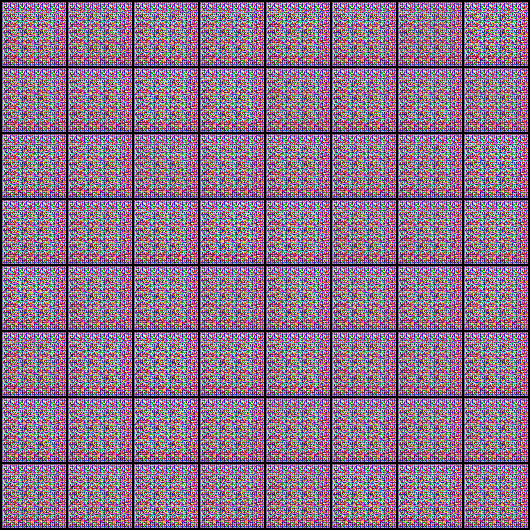

In [46]:
Image('./generated/generated-images-0001.png')


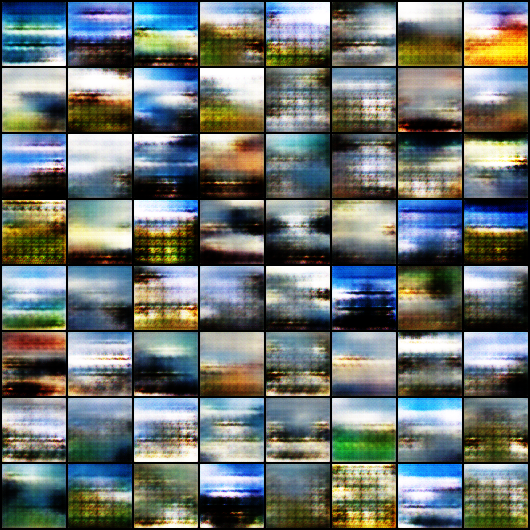

In [47]:
Image('./generated/generated-images-0024.png')


In [60]:
vid_fname = 'landscape_generator.mp4'

files = [os.path.join(sample_dir, f) for f in os.listdir(sample_dir) if 'generated' in f]
files.sort()

out = cv2.VideoWriter(vid_fname,cv2.VideoWriter_fourcc(*'MP4V'), 1, (530,530))
[out.write(cv2.imread(fname)) for fname in files]
out.release()

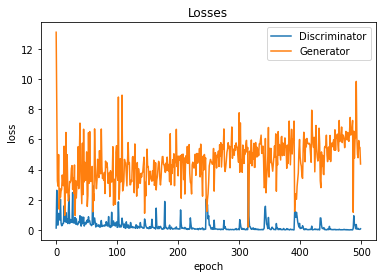

In [55]:
plt.plot(losses_d, '-')
plt.plot(losses_g, '-')
plt.xlabel('epoch')
plt.ylabel('loss')
plt.legend(['Discriminator', 'Generator'])
plt.title('Losses');

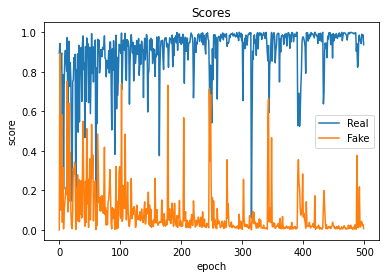

In [56]:
plt.plot(real_scores, '-')
plt.plot(fake_scores, '-')
plt.xlabel('epoch')
plt.ylabel('score')
plt.legend(['Real', 'Fake'])
plt.title('Scores');

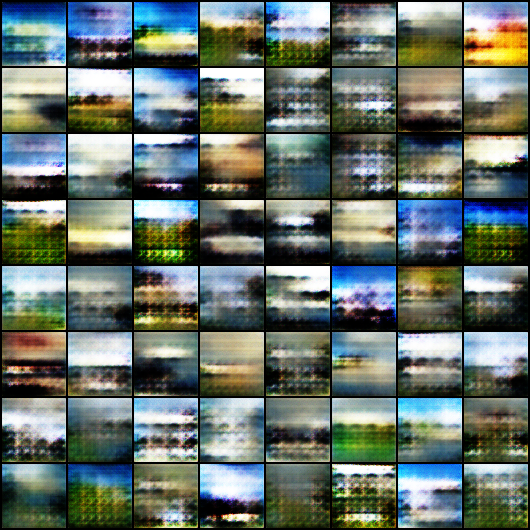

In [57]:
Image('./generated/generated-images-0023.png')

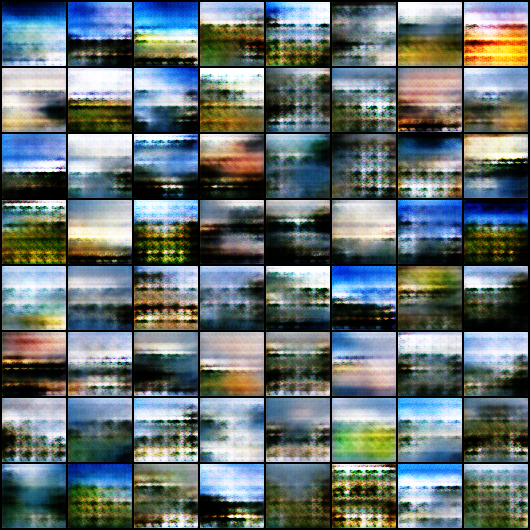

In [58]:
Image('./generated/generated-images-0022.png')

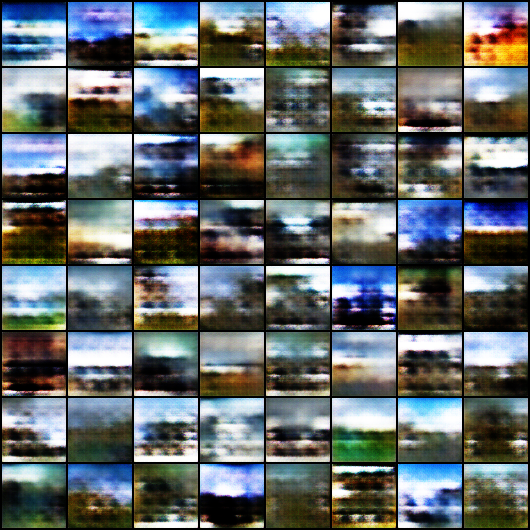

In [59]:
Image('./generated/generated-images-0025.png')